# Lý thuyết về ảnh

Bản chất của hình ảnh
- Được tạo thành từ các pixel, mỗi pixel chỉ có 1 màu duy nhất

Ảnh có hệ màu grayscale được biểu thị bởi 1 ma trận 2 chiều (color channel = 1, lúc này 0 là black, 1 là white) còn hệ màu RGB được biểu diễn bởi 1 ma trận 3 màu (color channel =3 ). Giá trị các phần tử nằm trong khoảng 0-255, ở trong hình các giá trị đã được normalized

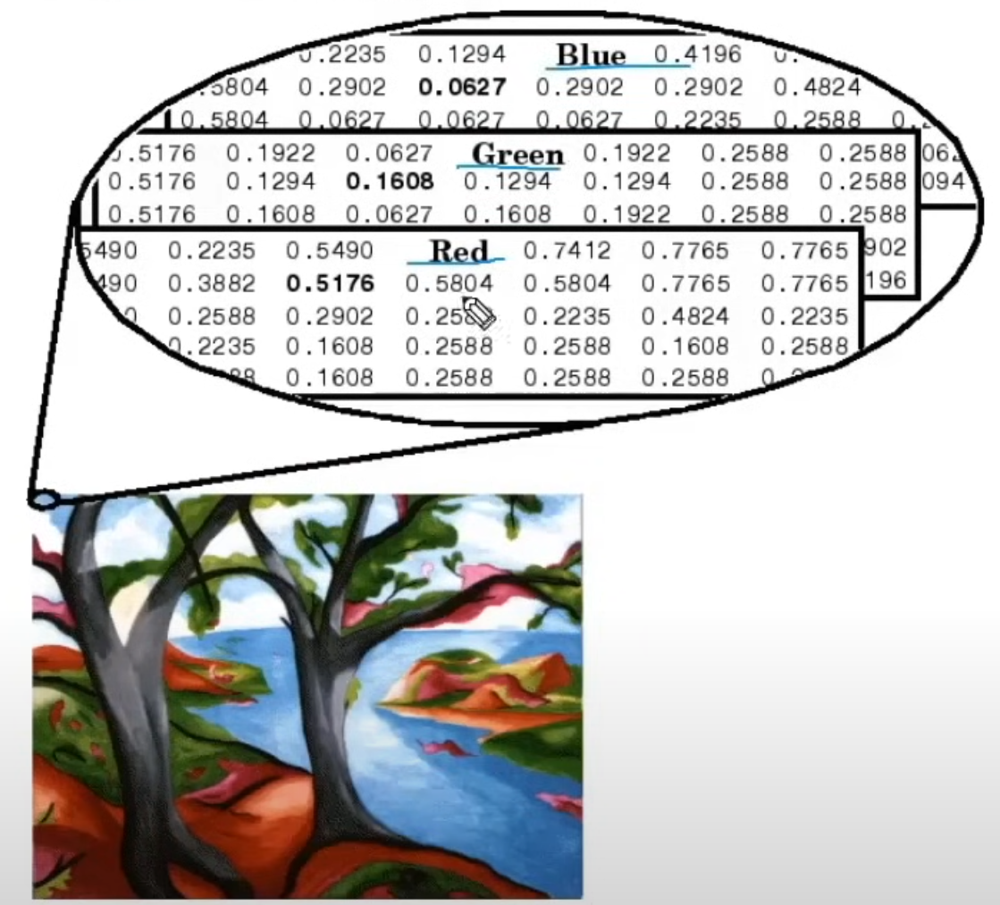

# Lý thuyết về mạng neutron CNN

## Với mạng neutron truyền thống

- Giả sử có n input signal đi vào neutron. Việc train model là phải xác định toàn bộ trọng số w0->wn trong mạng neutron
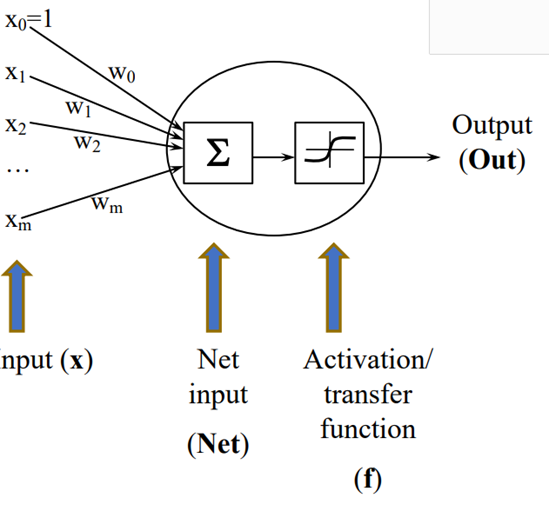

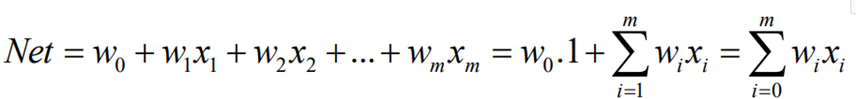
- Với cách này, mỗi input signal và bias sẽ có 1 trọng số w cần phải train và ouput sau khi đưa net và activation function sẽ là 1 số
- Nhược điểm cách này trong xử lý ảnh: giả sử ảnh màu có kích thước 64 * 64 => Nó được biểu diễn dưới dạng tensor 64 * 64 * 3. Giả sử hidden layer 1 có m neutron và ta sử dụng mạng thuộc dạng fully connected => Có (64 * 64 *3+1) parameter phải xác định cho mỗi neutron => (64 * 64 * 3+1)*m parameter cần phải xác định cho toàn bộ netron trong hidden 1. Số parameter sẽ còn tăng khi kích thước ảnh, số lượng hidden layer và neutron trong nó tăng lên. Máy tính không thể nào train được và dù train được cũng rất lâu, hàm f sinh ra sẽ cực kỳ phức tạp và gây trễ cao trong xử lý live video khi áp dụng model được train

## Với convolution neutural network: được sinh ra để giải quyết bài toán trên bằng cách thay đổi số lượng trọng số w sao cho phù hợp

- Tiền đề phải hiểu về 3 phép tính convolution/pading/strike: Chi tiét đọc tại https://nttuan8.com/bai-5-gioi-thieu-ve-xu-ly-anh/
  - Khi thực hiện phép convolution, ma trận output sẽ có kích thước 2 chiều đầu nhỏ hơn so với ma trận input. Padding được sử dụng để tăng kích thước sao cho ma trận output
  - Stride được sử dụng để quyết định bước nhảy mỗi lần dịch chuyển kernel, từ đó giảm được việc tính toán model. Xem tại https://www.youtube.com/watch?v=lxk_nmpqI5M
- Ý tưởng: Thay đổi cấu trúc hàm Net ở trên.
  - Ma trận X trong phép tính convolution chính là đại diện cho input signal cần ném vào 1 neutron (đây là con số cố định không thể thay đổi và là dataset).
  - Ma trận W hay còn gọi là filter/kernel/windown chính là 1 ma trận chứa các trọng số mà model cần train, tức việc train model là để ta học được ma trận kernel nó như thế nào chứ không phải ta cho trước ma trận kernel trước khi train. W luôn có size k*k trong dó k phải lẻ. Giả sử W có size 3 * 3, ta có thể thấy giờ đây môi input signal x(n) thay vì sử dụng tham số w(n) bất kỳ của riêng mk để tính x(n) * w(n) ném vào hàm Net thì nó sẽ sử dụng 9 tham số trong ma trận W để có dược kết quả ném vào hàm Net và đặc biệt 9 tham số này áp dụng cho tất cả các input signal/pixel => Số tham số cần train giảm mạnh xuống còn 9 thay vì rất nhiều như trên
  - Ma trận Y: chính là ouput của neutron sau khi đi qua activation function. Có thể thấy output giờ chính là 1 tensor chứ không phải là 1 số như trước kia nữa
- Ảnh BGR có 3 chiều chứ không phải 2 chiều như ảnh grayscale. Lúc này thay vì dùng mỗi filter k * k sẽ dùng filter có dạng k * k * 3 (cùng shape với input signal), Ngoài ra khi thực hiện phép covolution lên input signal và ma trận filter, ta còn phải cộng thêm bias nữa

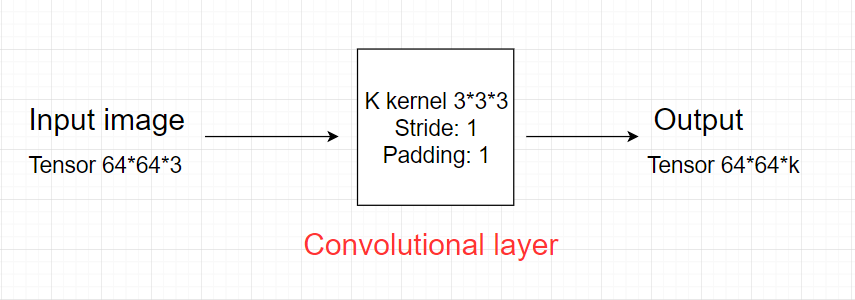


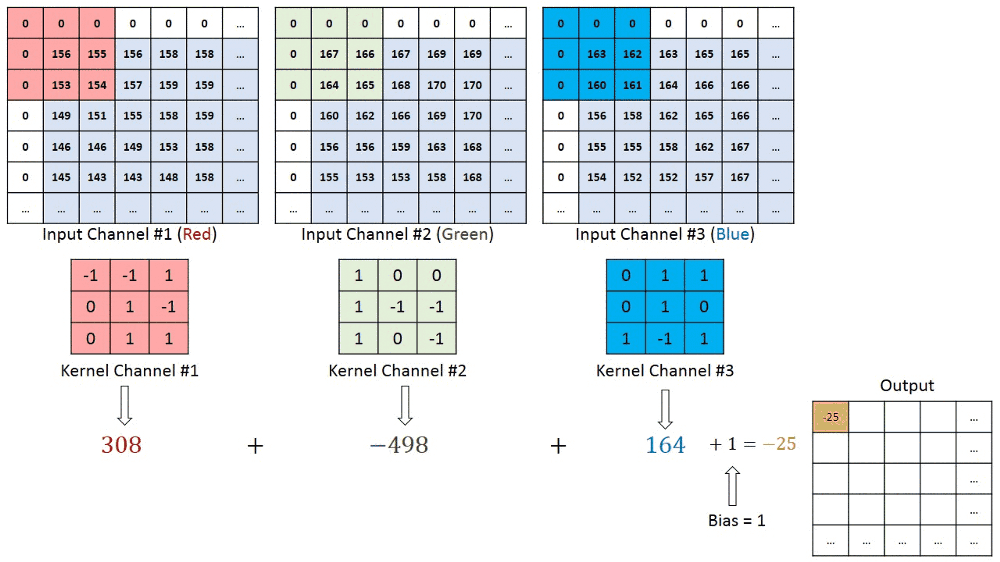

- Thường kết quả sẽ sau khi thực hiện phép convolution sẽ đi qua activation function khác rồi mới cho ra output. Trên hình chỉ thể hiện output là kết quả của phép convolution layer

Chi tiết về cách hoạt động của kernel trên ảnh: https://setosa.io/ev/image-kernels/

Mỗi 1 pixel trong input image sẽ được chọn làm tâm của kernel, do đó các kernel áp dụng với pixel ở biên sẽ cho ra kết quả unknown (di chuột để biết)

Tổng quát hóa lại cách CNN hoạt động với convolution layer và polling layer (dùng để subsamping)

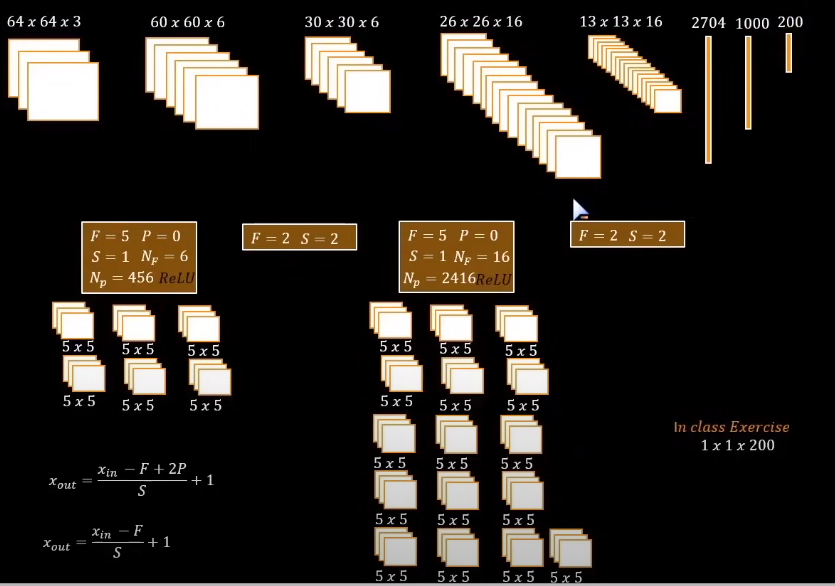

Đầu tiên ảnh (64 * 64 * 3) đi qua convolution layer 1:
- convolution layer này có 6 filter, mỗi filter có kích thước 5 * 5 * 3 => F = 5, tổng số parameter cần train là 6 * (5 * 5 * 3 + 1) = Np = 456
- Sau khi thực hiện phép nhân convoulution layer, ta đưa từng phần tử của ma trận output vào activation function Relu rồi thu được ma trận output mới là đầu vào của lớp max-pooling
- output của mỗi filter là 1 ma trận 2 chiều (luôn là thế) có kích thước áp dụng theo công thức đã nói ở trên
- có 6 filter nên output của convolution layer này là 6 ma trận 60*60

Outout của convolution 1 đi vào Polling layer 1 có size = (2 * 2), padding =0, strike = 2 => F=S=2, P=0, áp dụng công thức ta tính được kích thước output của Polling layer này là 30 * 30 * 6. Xem thêm về Polling layer tại: https://nttuan8.com/bai-6-convolutional-neural-network/

Output của Polling layer 1 tiếp tục đi vào Convolution layer 2 có 16 filter và đi ra tiếp polling layer 2 như trên hình

Ouput của pulling layer 2 là tensor shape = (13 * 13 * 16). Tiến hành làm phẳng nó về thành mảng có 13 * 13 * 16=2704 phần tử

Output trên sẽ đi qua các dense layer (fully contected layer) để có được kết quả cuối cùng


**Tóm lại**

**Kernel:**
- Mục đích: được sử dụng để phát hiện các đặc trưng (feature) như cạnh, góc, hoặc các mẫu cụ thể trong ảnh đầu vào.
- Cách hoạt động: Kernel là một ma trận nhỏ (thường có kích thước như 3x3, 5x5, v.v.) và phải có size là số lẻ, trượt qua toàn bộ ảnh đầu vào. Tại mỗi vị trí, kernel sẽ thực hiện một phép nhân điểm (element-wise multiplication) giữa các giá trị của kernel và các giá trị tương ứng trong vùng ảnh đầu vào, sau đó cộng tất cả các giá trị lại để tạo thành một giá trị đầu ra (còn gọi là pixel đầu ra).
- Kết quả: Quá trình này tạo ra một ma trận mới (feature map) chứa các đặc trưng đã được phát hiện. Nếu kernel di chuyển qua từng vị trí trên ảnh (với stride = 1), kích thước của feature map sẽ tương tự như ảnh gốc. Tuy nhiên, nếu stride > 1, kích thước feature map sẽ nhỏ hơn ảnh gốc.

**Polling layer:**
- Mục đích: được sử dụng để giảm kích thước không gian của feature map mà vẫn giữ lại những thông tin quan trọng nhất. Điều này giúp giảm số lượng tham số và tính toán trong mạng, cũng như giúp kiểm soát overfitting.
- Cách hoạt động: Pooling hoạt động bằng cách chia feature map thành các vùng nhỏ, sau đó áp dụng một phép toán lên mỗi vùng này để tạo ra một giá trị duy nhất.
   - Max Pooling: Lấy giá trị lớn nhất trong vùng.
   - Average Pooling: Tính trung bình các giá trị trong vùng.
- Kết quả: Pooling sẽ tạo ra một feature map mới có kích thước nhỏ hơn feature map ban đầu. Ví dụ, nếu bạn có một feature map 4x4 và áp dụng max pooling 2x2, bạn sẽ nhận được một feature map 2x2

## Tổng kết

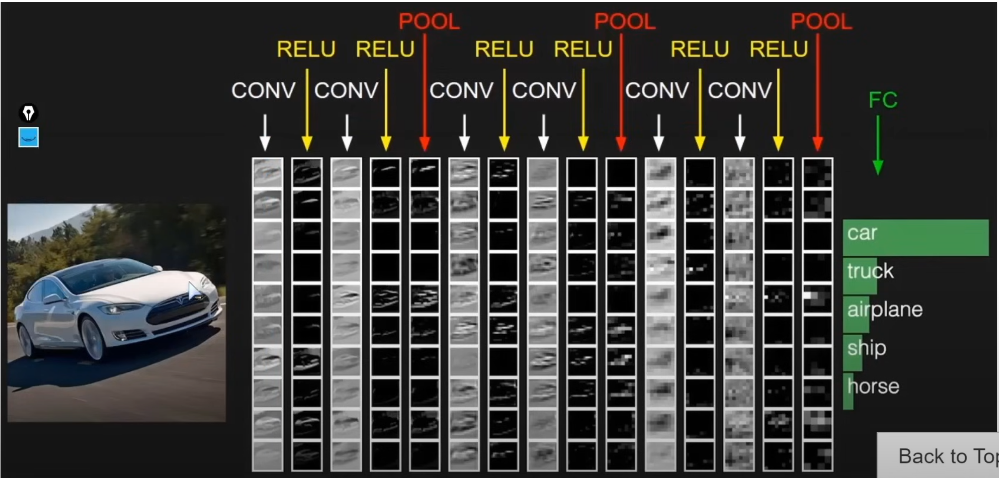

- Mỗi khi ảnh qua 1 convolution layer, ta thu được 1 ma trận mới gọi là feature map chứa các đặc trừng mà kernel trích xuất được. Ở những convolution layer đầu, việc diễn dải ý nghĩa giá trị của kernel này có tác dụng gì rất dễ dàng (ví dụ như kernel làm mờ, ...) và nó có tác dụng trích xuất những đặc trưng của ảnh. Tuy nhiên khi càng về các convolution layer sau, việc diễn dải ý nghĩa giá trị của kernel sau khi train được ngày càng khó thậm chí không thể giải thích được và nó dùng để phân loại ảnh.

=> Càng có nhiều convolution layer hay mạng càng sâu, ta càng trích xuất được nhiều đặc trưng của ảnh

=> Xem chi tiết demo tại 7:49:00 - 7:49:50

# Qúa trình train model

Gồm các bước: xác định kiến trúc models cần train, loss function dùng để train và các metric, callback trong quá trình train

Đặc biệt sau khi train cần phải visualization để đánh giá kết quả train model trên tập validate set để rút ra quá trình train có bị overfitting hay under fitting không

## Xây dựng kiến trúc model bằng tensorflow/keras

Để build 1 model trong tensorflow, ta sử dụng tf.keras

- Sử dụng các model đã được build sẵn trong keras: thường là các model nổi tiếng như ResNet, EffecientNet, ...
- Tự build 1 model của riêng mình bằng cách sử dụng các lớp có sẵn trong tf.keras.layers:
    - Các layer có sẵn:
       - InputLayer(): format quy định kích thước của input shape trước khi vào model
       - Conv2D() để tạo convolution layer với ảnh, Conv1D(): tạo convolution layer với dữ liệu dạng text, âm thanh, Conv3D(): tạo convolution layer với dữ liệu dạng video
       - MaxPool2D(): Max-Pooling layer ứng với Conv2D(), tương tự có MaxPool1D() và MaxPool3D()
       - BatchNormalization(): Tạo layer với mục đích normalized ảnh
       - Flatten(): Làm phẳng ma trận 2, 3, ... chiều thành ma trận 1 chiều duy nhất
       - Dense(): fully connected layer
    - Các loại model có thể build:
       - Sequential API: model tuần tự, output của layer này là input của layer tiếp theo bằng cách sử dụng tf.keras.Sequential
       - Functional API:
       - Modle Subclassing:

Sequential API: 
   - Là cách đơn giản nhất để tạo ra model bằng cách xếp trồng các layer lên nhau. Nó phù hợp để xây dựng mô hình tuyển tính (output của layer này là input của layer tiếp theo). 
   - Mỗi 1 layer chỉ có 1 input và 1 ouput
   - Ưu điểm: Dễ build ra các mô hình tuyến tính, dễ sử dụng
   - Nhược điểm: Không thể build mô hình phức tạp như đệ qui, layer có 2 input từ 2 layer trước đó, kết hợp, rẽ nhánh ...

   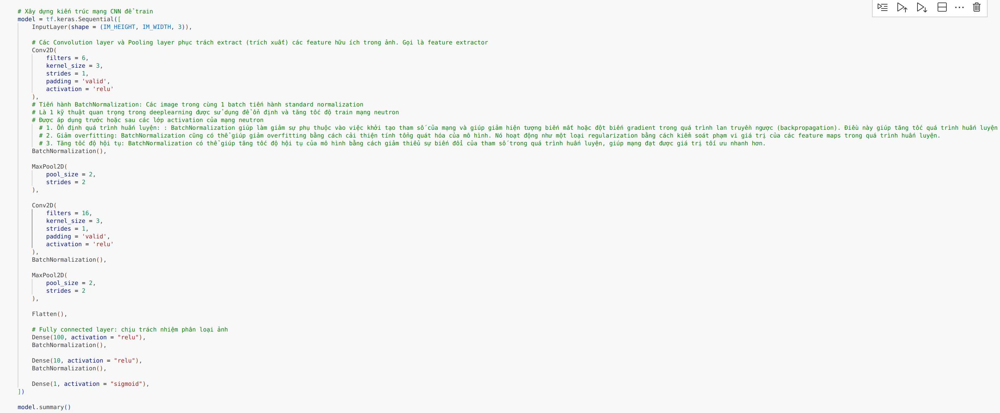

Functional API:
   - Là một cách tiếp cận linh hoạt hơn để xây dựng mô hình, phù hợp cho cả những mô hình đơn giản và phức tạp.

   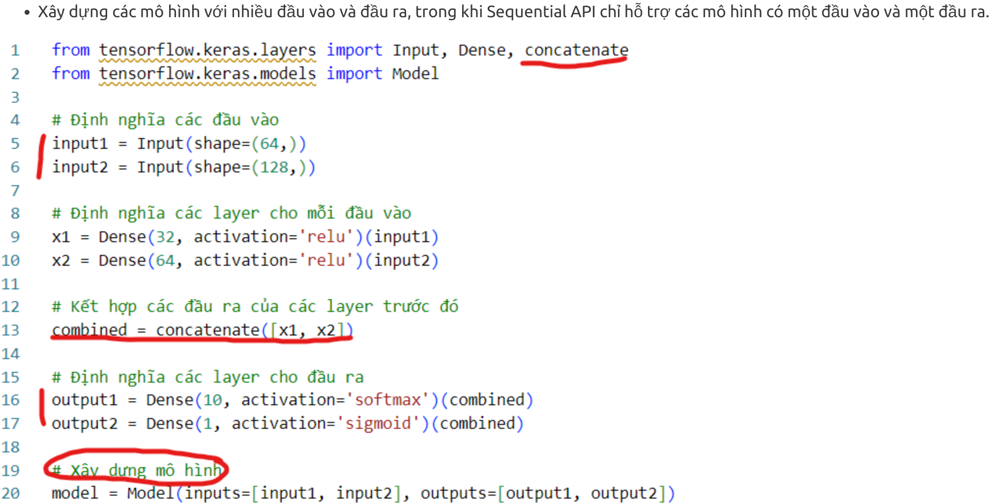

   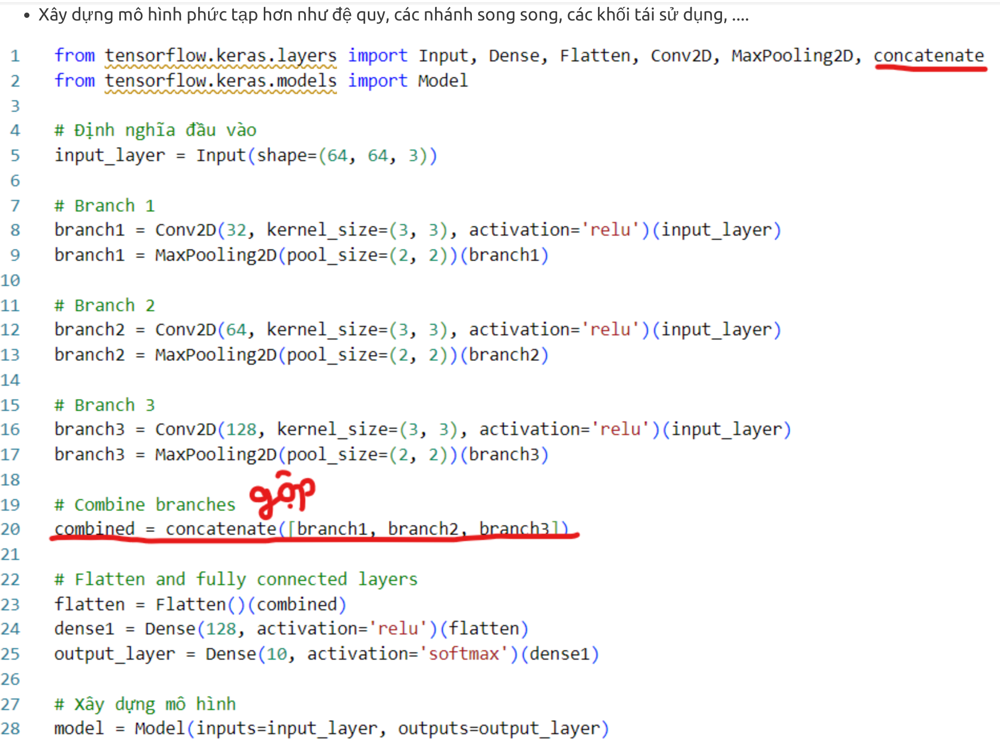

   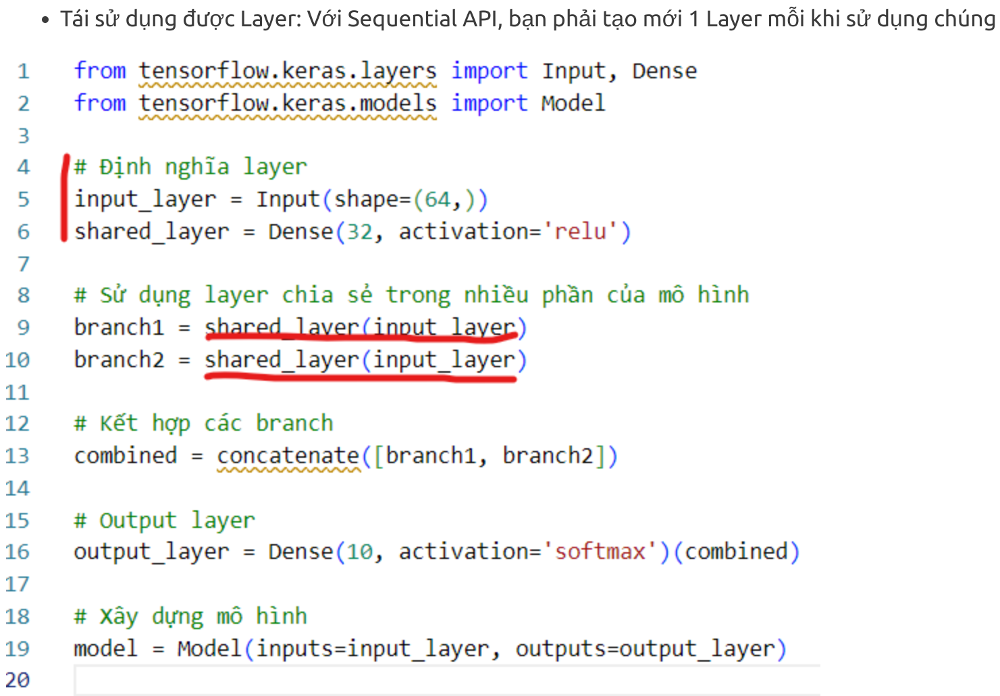

Model SubClassing:
   - Là cách tiếp cận linh hoạt nhất và phức tạp nhất để xây dựng mô hình. Cho phép tùy chỉnh toàn diện bằng cách kế thừa từ lớp Model của Keras và định nghĩa các tầng và hành vi của mô hình.
   - Các layer bạn custome ra phải kế thừa layer Model của keras
   - Ưu điểm: cách xây dựng model linh hoạt nhất, có thể xây dựng mọi model
   - Nhược điểm: đòi hỏi nhiều công sức để tạo ra layer và code khó đọc

   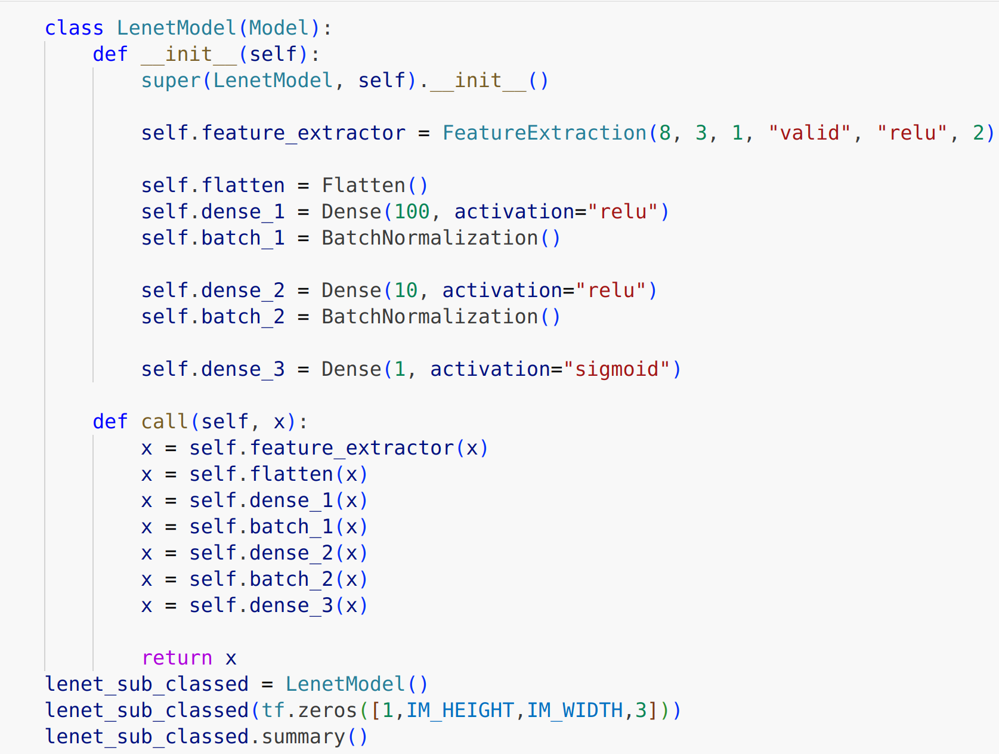

Ngoài việc sử dụng các layer có sẵn trong keras, ta có thể tự định nghĩa 1 layer mới bằng cách tạo 1 class kế thừa lớp layer. call là function sẽ được gọi sau khi __init__init()

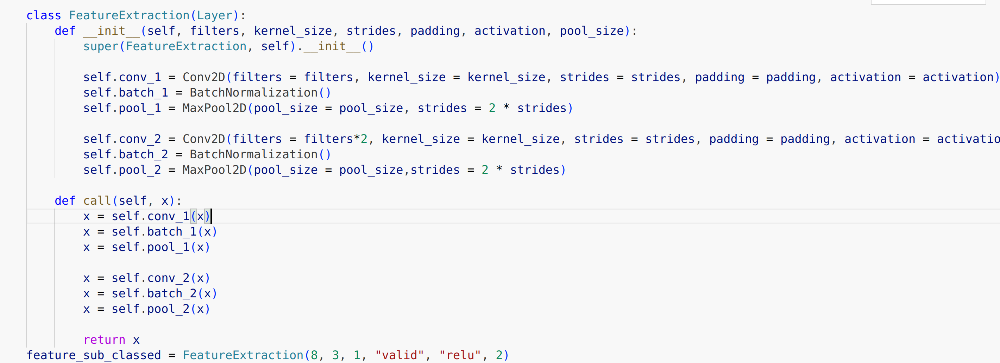

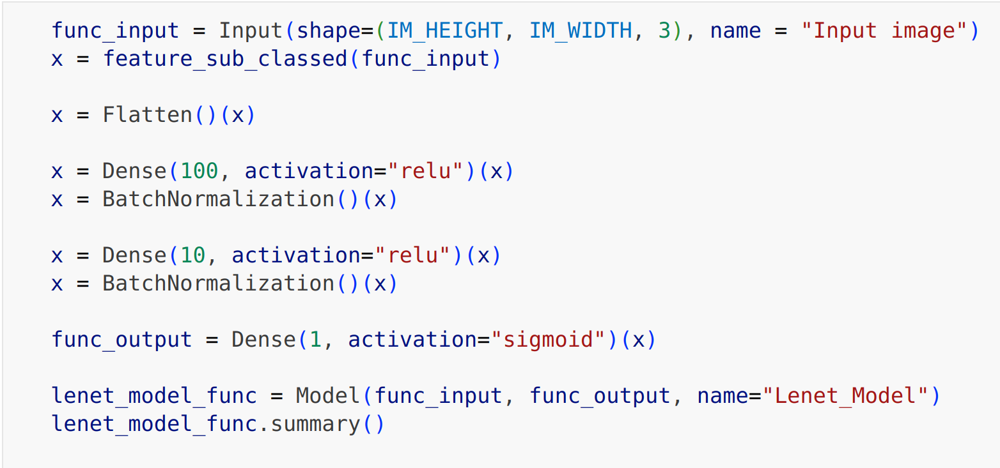

Sử dụng model có sẵn trong keras là cách thích hợp nhất (vì bản thân có tự nghiên cứu ra đâu :v)

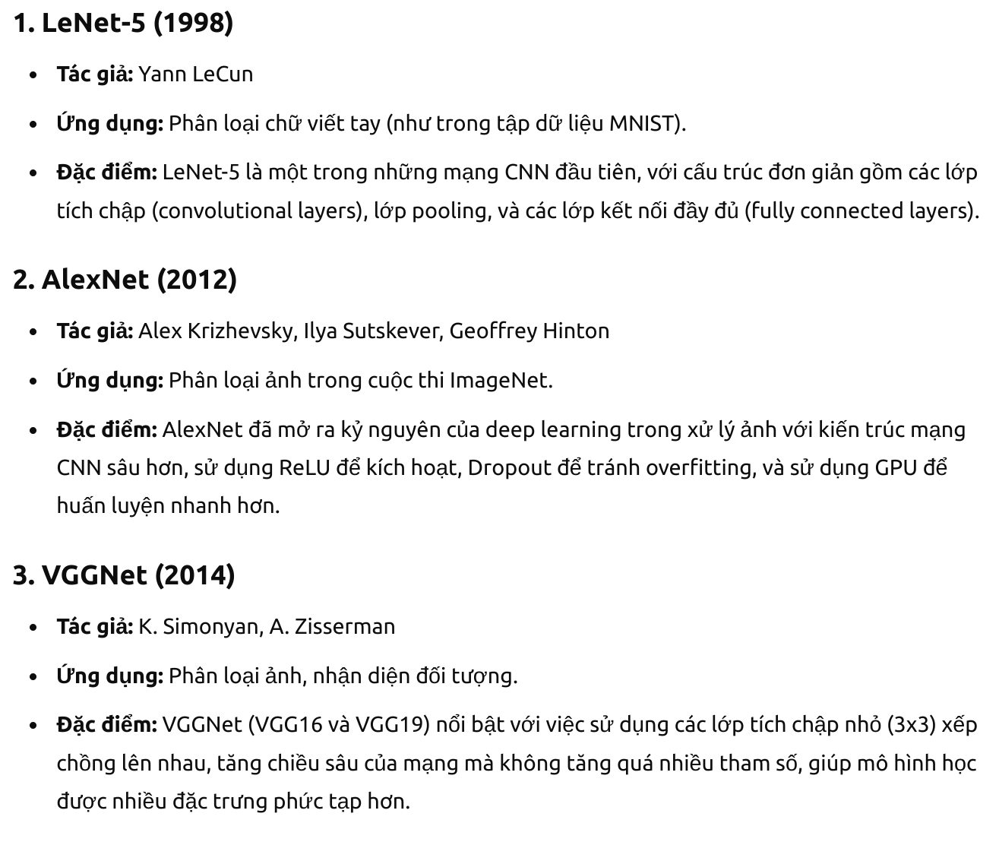

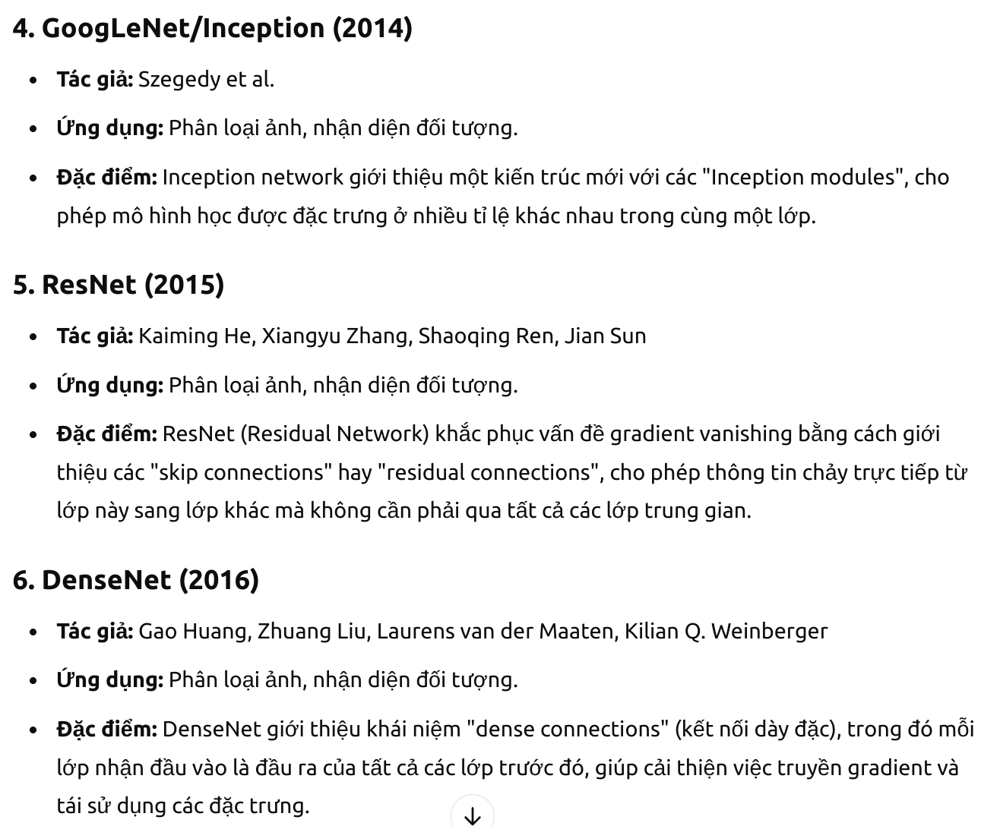

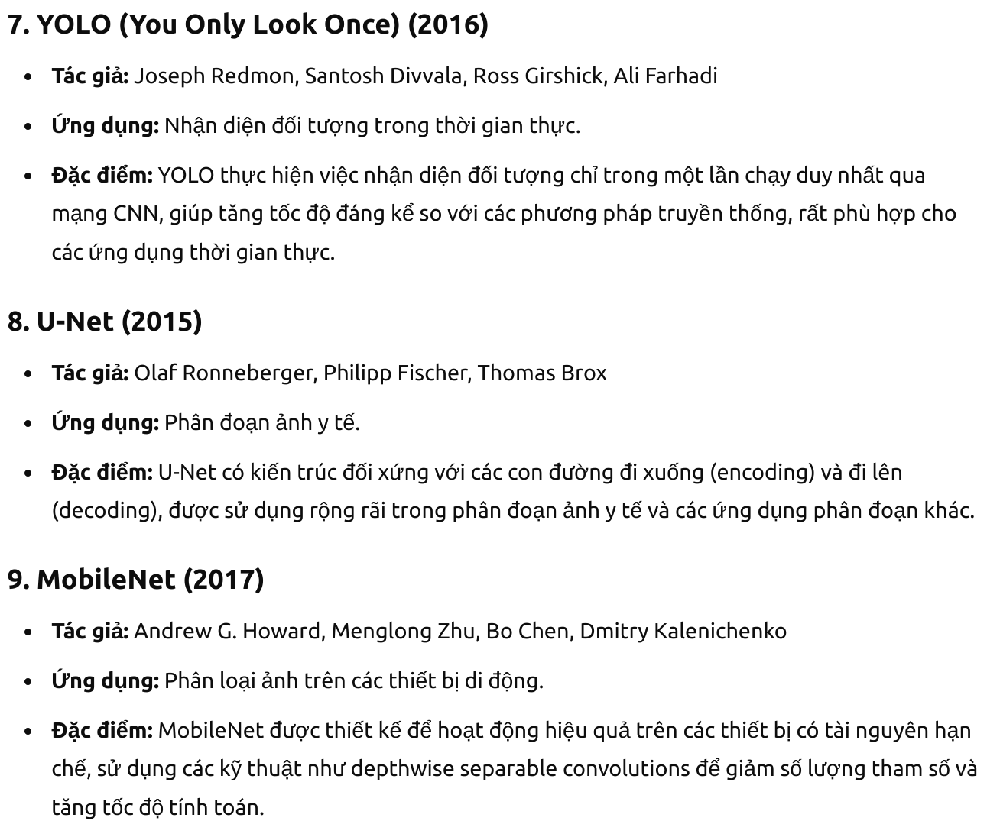

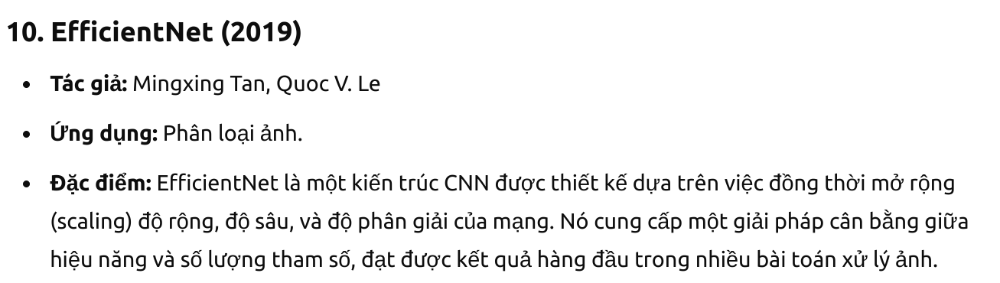

## Xác định Loss Function

Chi tiết các loại loss function xem tại: https://ml-cheatsheet.readthedocs.io/en/latest/loss_functions.html

Quy ước: M là số lượng class cần train, p là giá trị model predict, y là giá trị label thực tế

- Cross-Entropy: hay còn được gọi là log loss. Được dùng trong các bài toán phân loại khi giá trị của ouput model nằm trong đoạn [0, 1] (để ý activation function của neutron cuối cùng). Khi M = 2, gọi là BinaryCrossEntropy

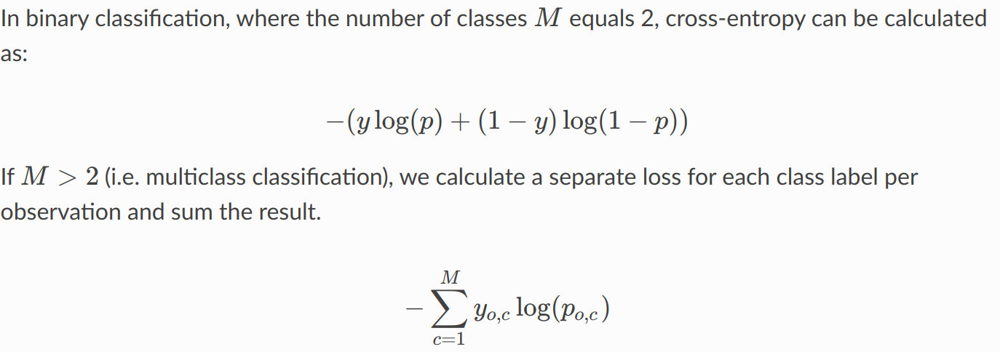

## Xác định các metric để đánh giá kết quả train model

Dùng training set để xác định được ma trận trọng số của model, dùng validate set để xác định ma trận trọng số có hoạt động tốt với lượng data chưa từng nhìn thấy hay không.

Để đánh giá model sau mỗi lần train có tốt hay không, ta sử dụng các metric để đánh giá. Có rất nhiều loại metric, mỗi loại metric cho ta 1 góc nhìn nhất định về kết quả train. Loss cũng là 1 metric để ta đánh giá nhưng nó không dễ hiểu với con người.

Ngoài dựa vào BinaryCrossEntropy để đánh giá model (vừa làm loss, vừa là metric để đánh giá) hay accuacy (sự chính xác), còn rất nhiều metric khác có thể  dùng để đánh giá model:

- 4 tham số bổ trợ **accuaracy**:
    - **TruePositives(TP)**: *tỷ lệ model dự đoán đúng các label = 1 (trong bài này nghĩa là model dự đoán đúng những người không bị bệnh - Uninfected)*
    - **FalsePositives(FP)**: *tỷ lệ model dự đoán sai các label = 1 (trong bài này nghĩa là model dự đoán sai những người không bị bệnh thành bị bệnh)*
    - **TrueNegatives(TN)**: *tỷ lệ model dự đoán đúng các label = 0 (trong bài này nghĩa là model dự đoán đúng những người bị bệnh - Parasited)*
    - **FalseNegatives(FN)**: *tỷ lệ model dự đoán sai các label = 0 (trong bài này nghĩa là model dự đoán sai những người bị bệnh thành không bị bệnh. Điều này cực kỳ nguy hiểm trong y tế vì thà dự đoán sai những người không bị bệnh thành bị bệnh để họ qua kiểm tra bác sĩ còn hơn. Có rất nhiều người tự tin vào AI và nghe theo phán quyết của AI mà không đi khám bác sĩ sau đó. Để model hoạt động tốt nhất, ta cần phải tối giản FN trong bài toán này về tối thiểu chứ không phải dựa vào accuaracy)*
    - 4 tham số trên có thể tổng hợp vào 1 ma trận gọi là confusion matrix

    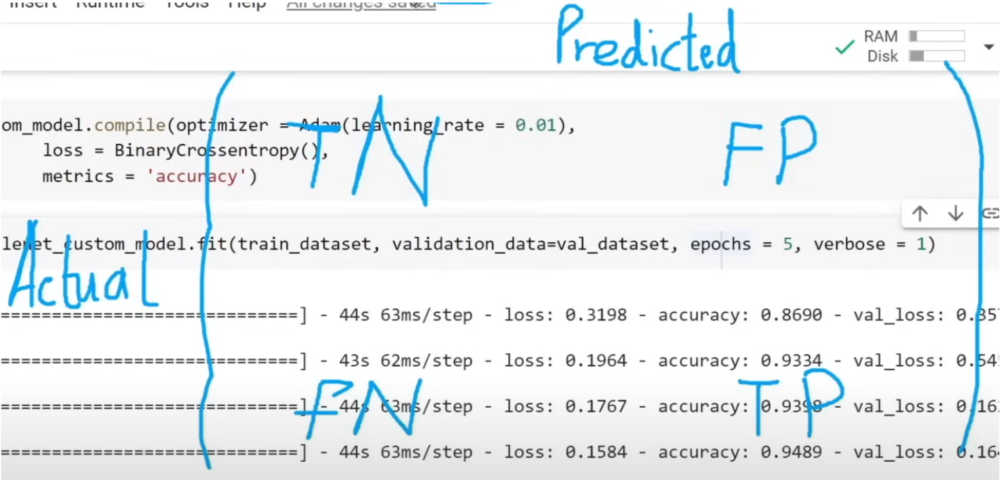
    
- Các metric khác

    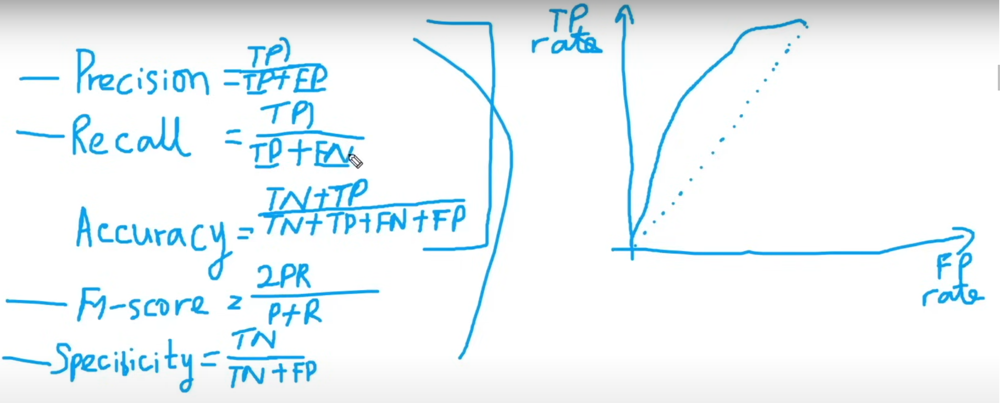

    - **Precision**: Nếu FP càng cao thì Precision càng thấp. Dự đoán tỷ lệ chính xác khi model dự đoán các mẫu thực sự dương tính
    - **Recall**: Nếu FN càng cao thì Precision càng thấp. Bài này cần FN nhỏ nhất có thể  hay recall lớn nhất có thể
    - **Specificity**: Ngược lại với Precision, dự đoán tỷ lệ chính xác khi model dự đoán các mẫu thực sự âm tính
    - **F1-score**: là chỉ số cân bằng giữa Precision và Recall. Nó cung cấp 1 con số để đánh giá cả 2 khía cạnh này cùng 1 lúc. Chỉ số này đặc biệt hữu ích khi dataset mất cân bằng, cân bằng việc giảm thiểu giữa FP và FN
- Đánh gias model dựa vào đồ thị thường dùng trong bước evaluation để tìm threshold tốt nhất 1 cách tự động(xem phần đánh giá model sau khi train)
    - **ROC (Receiver operating chracteristics)**: Model được biểu diễn bởi 1 đường cong. Mỗi điểm trên đường cong ROC tương ứng với giá trị của 1 threshold, bạn cần chọn threshold sao cho đồ thị có TP lớn nhất (TP lớn nhất nghĩa là recall lớn nhất và FN nhỏ nhất. Tuy nhiên nếu bạn phải làm việc với Precision sẽ không khôn ngoan nếu chọn TP lớn nhất vì nó dẫn đến FP lớn nhất) và FP nhỏ nhất. Thường ta sẽ chọn điểm cân bằng, là giao điểm của đường chéo và đường ROC

    ![image-3.png](attachment:image-3.png)

    - **AUC (Area Under the Curve)**: Là phần diện tích dưới đùng ROC, dùng để chọn model tốt nhất. Khi train model, mỗi epoch sẽ cho ra 1 model. model nào có UOC lớn nhất và gần bằng 1 thì sẽ là model tốt cho ra kết quả TP rate và FP rate tốt nhất

    ![image-4.png](attachment:image-4.png)

## Xác định các callback

Hiểu nôm na callback là 1 hàm mà ta tự định nghĩa hoặc lấy từ thư viện nào đó. Trong quá trình train model, mỗi khi tính toán xong 1 epoch, hàm callback sẽ được gọi.

Bằng cách sử dụng call back ta có thể thực hiển được rất nhiều điều. Ví dụ như 
- log các thông tin sau mỗi lần train để ta có thể thấy được kết quả train
- early stopping-tự động dừng train khi bạn nhận thấy việc train model tiếp không cải thiện được khả năng học của model mà còn dẫn đến bị over fitting
- model checkpointing: lưu kết quả train cho ra hiệu suất tốt nhất trong cả quá trình train

### Tự build (custome) callback

Bắt buộc phải kế thừa class [tf.keras.callbacks](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks)
- [tf.keras.callback.History()](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/History): đây là kết quả trả về sau quá trình train model khi bạn sử dụng model.fit() theo mặc định.
- 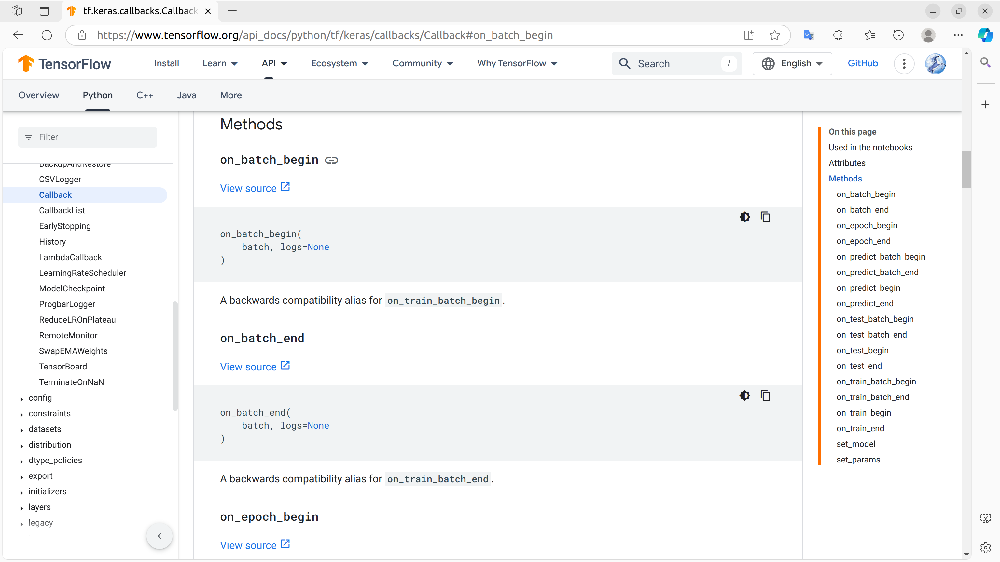. Để ý bên phải màn hình có mục lục để đọc nhanh hơn, có các hàm có thể kế thừa như on_batch_begin()-được kích hoạt mỗi khi model bắt đầu thực hiện trian 1 batch, ...

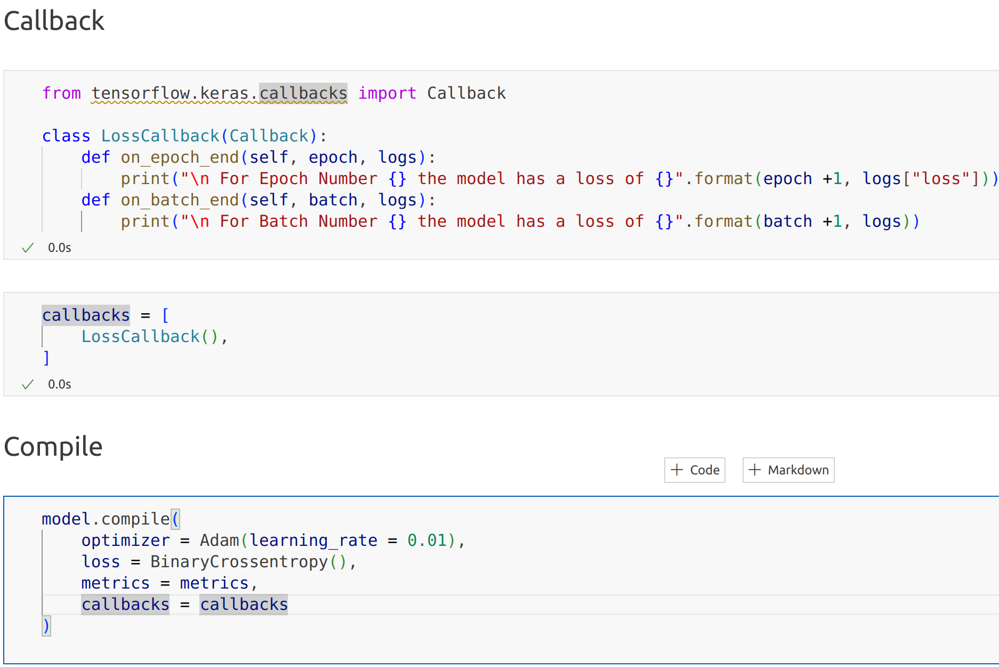

### Sử dụng callback có sẵn trong keras

- [tf.keras.callbacks.CSVLogger](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/CSVLogger): ghi kết quả train sau cùng của mỗi epoch ra 1 file csv.

    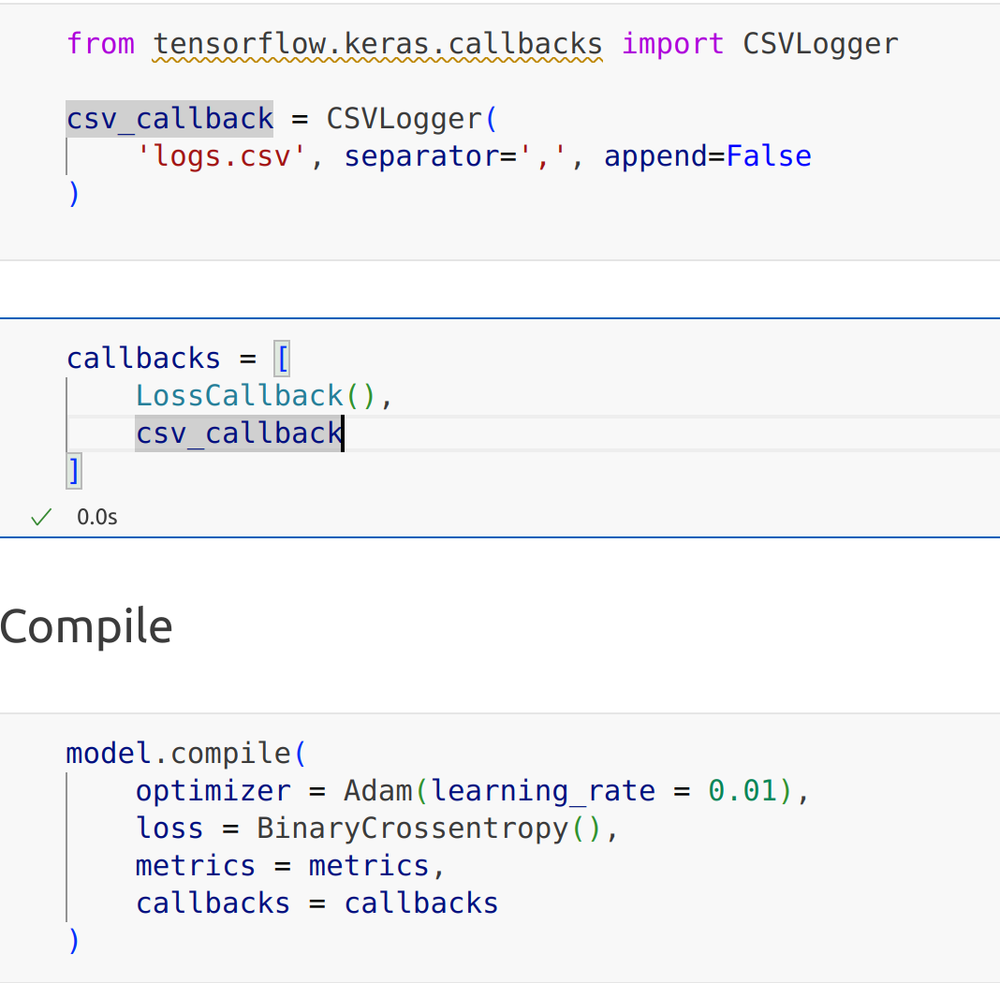.

- [tf.keras.callbacks.EarlyStopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping): thường khi train, ta sẽ thấy tại 1 thời điểm nào đó kết quả train sẽ không thể tăng thêm được nữa dù có train nhiều epoch đi chăng nữa. Lúc này ta sẽ nghĩ đến giải pháp làm thế nào để máy tính tự động phát hiện model không thể học được nữa và dừng train ? => Sử dụng early stopping callbacks. Ngoài ra sử dụng early stopping còn giúp model tránh over fitting.

    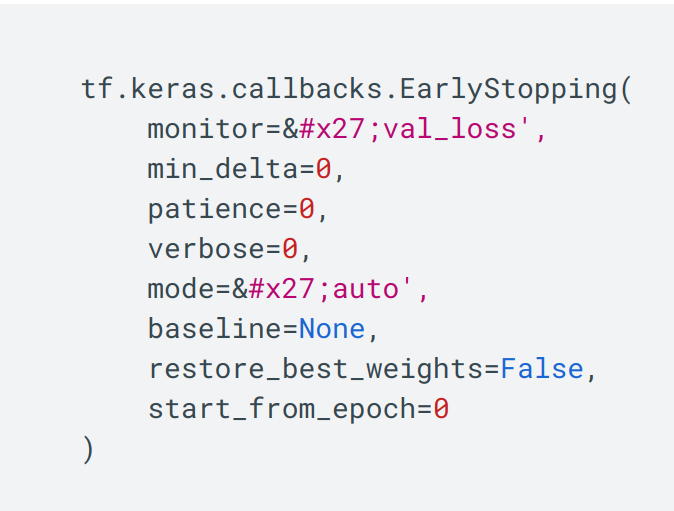.

    monitor: giám sát. Đưa ra tên của metric mà bạn muốn models giám sát để thực hiện early stopping.

    min_delta: giá trị nhỏ nhất được chấp nhận là model có cải thiện. Nếu giá trị monitor sau khi train thay đổi 1 khoảng nhỏ hơn min_delta thì nó được cho rằng là không cải thiện.

    patience: số epoch tối đa mà model có thể chấp nhận nếu việc học không cải thiện. Giả sử sau khi train 4 epoch, model nhận thấy việc học không được cải thiện, nó sẽ tiến hành dừng train.

    mode: để auto theo mặc định. Nếu nó là min, model sẽ dừng train khi càng học càng giảm. Nếu nó là max, models sẽ dừng train khi hocj tiếp không cải thiện

    restore_best_weight: để false theo mặc định. Nếu là true, mỗi khi model học không cải thiện hoặc thụt lùi, nó sẽ lấy kết quả train tốt nhất của các epoch trước đó làm final state để thực hiện việc train epoch tiếp theo.

    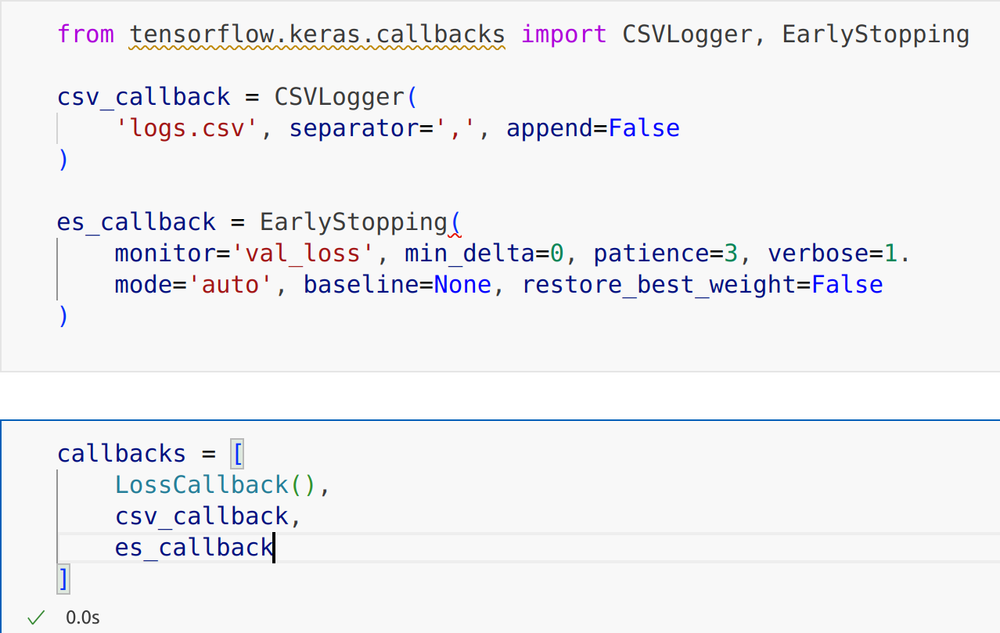.

- learning rate scheduler: dùng để thay đổi giá trị learning rate 1 cách tự động trong quá trình train. 

    Learning rate quá lớn thì model sẽ nhanh chóng đến gần điểm cực tiểu toàn cục của đồ thị hơn. Tuy nhiên nó có thể nhảy qua điểm cực tiểu của đồ thị => Lý do cần thêm mometune.

    Learning rate quá nhỏ thì model sẽ chậm đến điểm cực tiểu toàn cục của đồ thị hơn. Thậm chí có khi nó không bao h thoát ra khỏi điểm cực tiểu địa phương dẫn đến kết quả train model không bao h là tốt nhất.
    
    Cần linh hoạt sử dụng learning rate nhỏ hay lớn trong quá trình train và đó chính là ý nghĩa của callback này. Ta có thể custome chiến lược sử dụng learning rate mỗi epoch.

    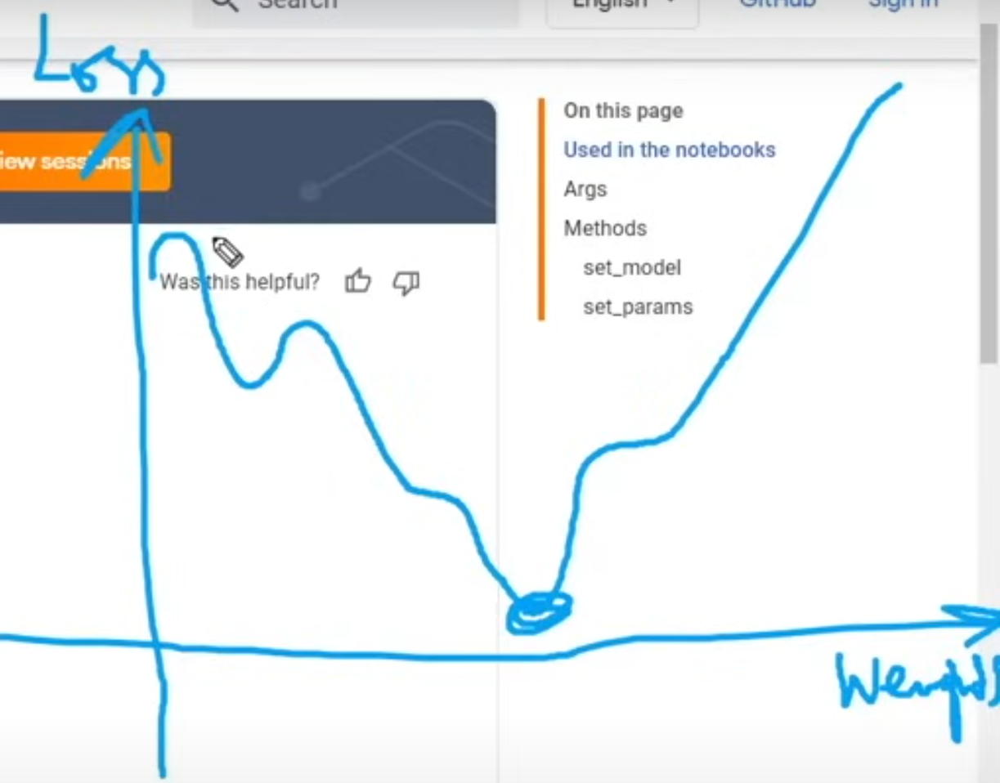.

    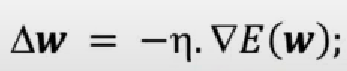.

    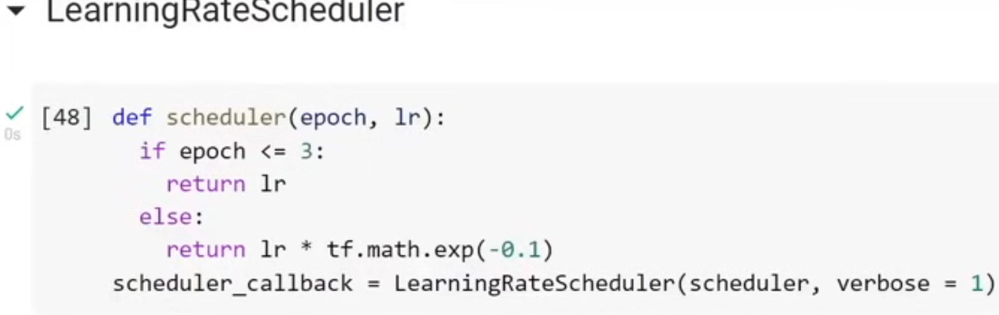.

    Sử dụng [mxnet project](https://mxnet.apache.org/versions/1.9.1/api/python/docs/tutorials/packages/gluon/training/learning_rates/learning_rate_schedules_advanced.html), là 1 project của nhà apache để chọn các chiến lược thay đổi learning rate được build sẵn.

- [tf.keras.callbacks.ModelCheckpointing](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint): dùng để lưu giá trị trọng số của model trong quá trình train. Thực tế không phaỉ lúc nào giá trị trọng số sau cùng khi train cũng là giá trị tốt nhất (ví dụ như early stopping).
    
    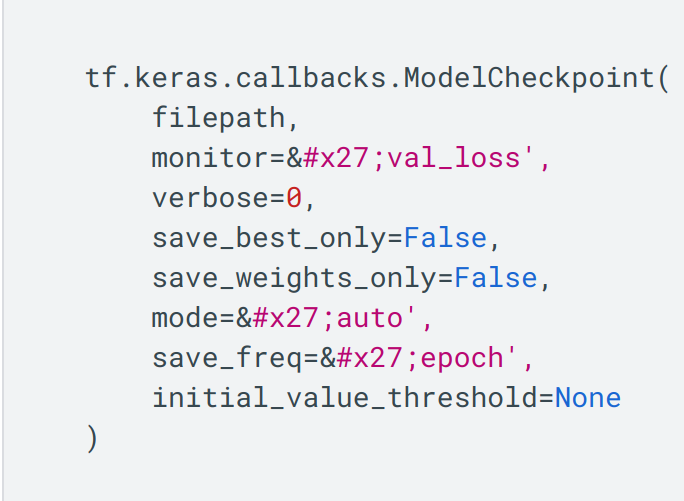.

    filepath: nơi lưu model
    monitor: loại giá trị mà model sẽ giám sát (như early stopping)
    save_best_only: Nếu là true thì nó sẽ luôn lưu model có giá trị tốt nhất. Nếu False thì nó sẽ luôn lưu model ở epoch cuối cùng.
    save_weight_only: Nếu là false sẽ lưu toàn bộ các tham số của model
    mode: cứ để auto
    save_freq: không nên lưu model sau mỗi epoch vì làm như vậy thì model sẽ rất chậm. Nên set là 3

- [tf.keras.callbacks.ReduceLROnPlateau](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ReduceLROnPlateau): Hiểu nôm na learning rate sẽ giảm dần theo thời gian train

    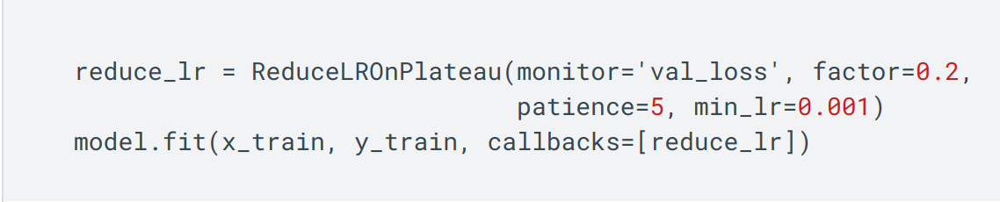.

    monitor: loại giá trị mà model sẽ quan tâm.
    patience: Sau patience epoch, nếu "monitor" không giảm, hàm này sẽ giảm giá trị learning rate bằng tham số factor
    factor: leaning rate mới = leanring rate cũ * factor

## Đánh giá model

Không phải lúc nào việc build model cũng thuận lợi, build 1 phát được ngay model ưng ý và dừng. Model có thể gặp phải 2 loại vấn đề và khi gặp phải 2 loại vấn đề này ta sẽ biết phải chỉnh sửa lại cả quá trình train và train lại. 2 vấn đề này đgl over fitting và under fitting.

Overfitting: diễn ra khi việc train quá lâu không có cơ chế early stopping hay check pointing, do đó model thu được luôn là model sau cùng. Đặc điểm của model này là cho các metric với training set rất cao (ví dụ như accuracy 99%) nhưng với validate set thì cho kết quả rất thấp. Đồ thị của model như hình dưới. Model học quá khớp với training set thay vì extract useful information hoặc những tri thức từ training set

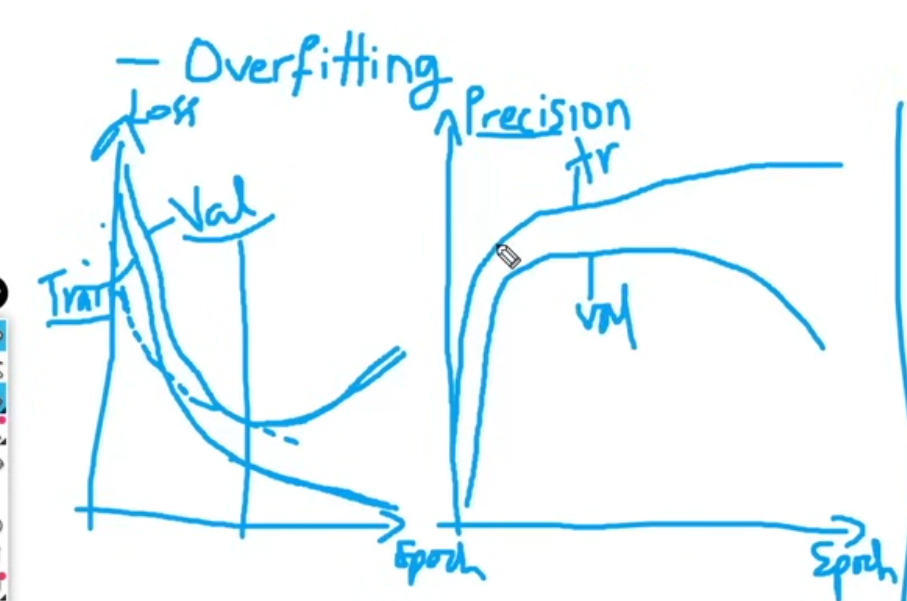.

- Small dataset và model quá lớn (quá nhiều tham số cần train)

- Tập dataset thiên vị, không cân bằng (ví dụ như quá nhiều sample về math và ít sample về English, History. Điều này dẫn đến model train ra dự đoán rất tốt math nhưng dự đoán không tốt English và History)

Underfitting: diễn ra khi bạn metric đạt đến giới hạn và không thể tăng thêm được nữa dù có train lâu hơn đi chăng nữa. Ví dụ như dù train thế nào accuracy cũng dừng ở 60 %.

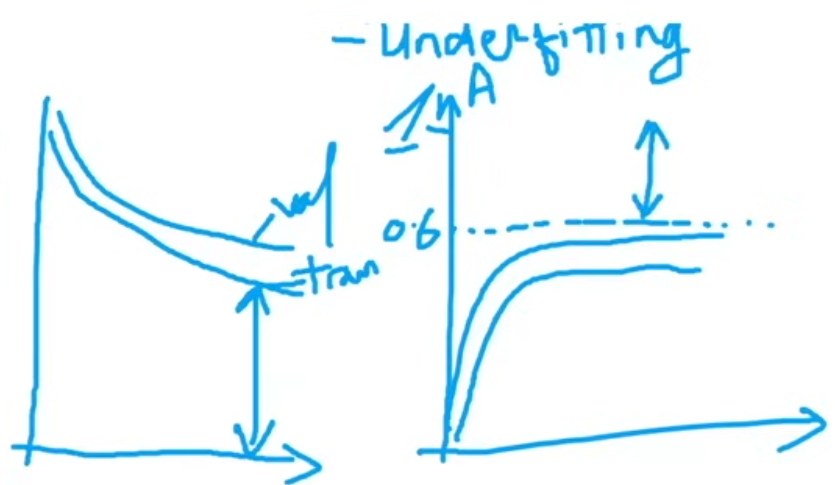.

- Small dataset, dataset không đại diện hết tất cả các trường hợp có thể gặp trong thực tế.
- Kiến trúc model quá đơn giản không thể extract information từ dataset.

Giải pháp cho overfitting:
- thu thập thêm dataset, đa dạng và cân bằng giữa các class.
- data augmentation: làm cho mỗi epoch khi train, model nhìn thấy tập batch khác train khác nhau (ví dụ như sort lại training set trước khi vào epoch mới, thực hiện image preprocessing như quay ảnh, cắt ảnh, giảm độ sáng, ... sao cho nó vẫn còn giữ được đặc trưng của class). Cách này cũng là cách để tăng tập dataset khi số lượng image quá nhỏ
- dropout: tạo ra 1 kiến trúc model có khả năng dropout 1 số neutron trong quá trình train. Bằng cách này có thể tránh được hiện tượng model quá tự tin khi train lại 1 ảnh đã từng train
- regularization: 

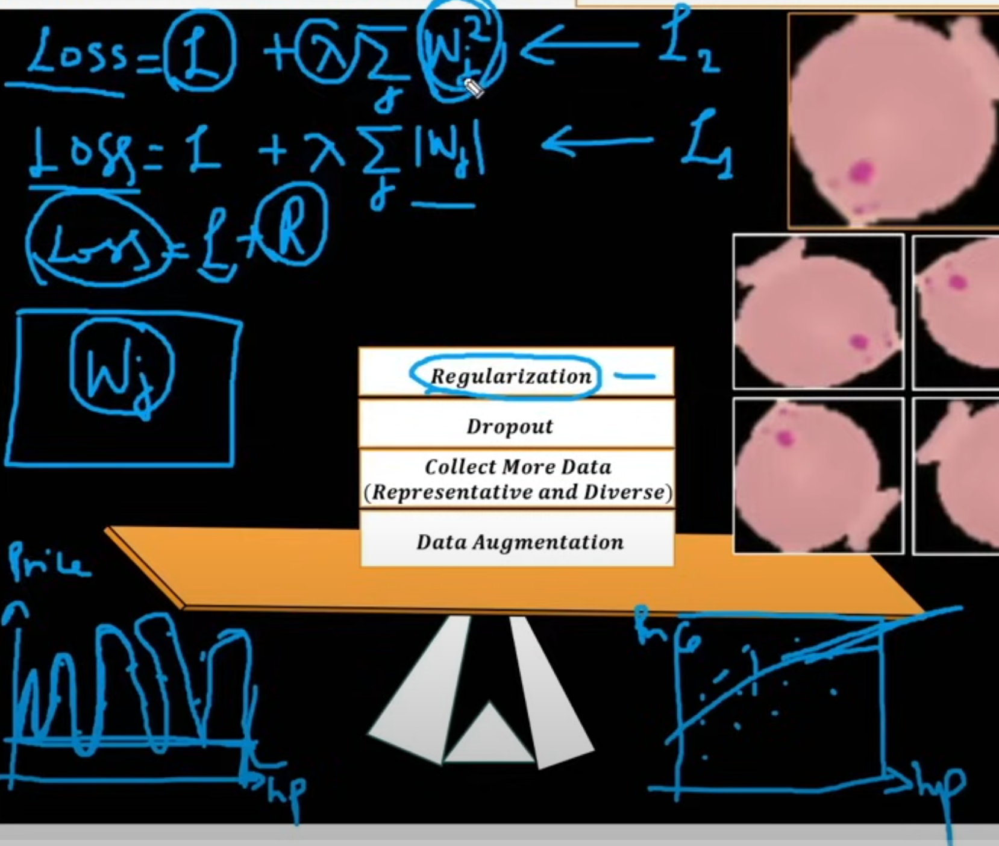

- early stopping + model checkpointing (lấy model tốt nhất trong quá trình train).

- reduce size của network

- hyperparameter tuning: Là quá trình xác định tham số của mạng neutron sao cho quá trình train cho ra hiệu suất tốt nhất. Ví dụ như ta muốn xây 1 network có 3 dense layer. Nhưng ta không biết mỗi layer nên có bao nhiêu neutron là tốt nhất. Ta sẽ thực hiện thử tất cả các trường hợp như mỗi layer có số neutron là 16, 32, 64, 128 và train tất cả các th. Sau khi train ta sẽ trọn được network có kết quả tốt nhất. Ngoài ra còn có thể thử với nhiều loại batch size, droput rate, regulation rate, learning rate, ... Batch size tốt nhất lên là 32.
- Normalization: 

Giải pháp cho Under fitting:
- Xây dựng kiến trúc model phức tạp hơn thay vì tự chế lenet model:
- Thu thập nhiều dataset hơn và đa dạng, cân bằng hơn.
- Train lâu hơn và kiên nhẫn hơn. Có những model chỉ có thể đạt hiệu suất cao khi train đến 1000 epoch
- Hyperparameter turning
- Normalization

## Cải thiện model

Sau khi đánh giá model, hiển nhiên nếu model chưa tốt ta sẽ phải cải thiện nó. Mà chính xác hơn, ta nên áp dụng những biện pháp sau khi train model

### Data Augmentation (tăng cường dữ liệu)

#### Tạo ra 1 image mới từ 1 image

2 cách sử dụng data augmentation. Lưu ý mỗi khi sử dụng chiến lược nào cần visualization ảnh sau khi tiền xử lý để xem nó có còn giữ thông tin đặc trưng của ảnh hay không.
- [tf.image](https://www.tensorflow.org/api_docs/python/tf/image)
- [tf.keras.layers](https://www.tensorflow.org/api_docs/python/tf/keras/layers):
- Tự custome 1 layer mới bằng cách kế thừa [tf.keras.layers.Layer]()

**Lưu ý data augmentation chỉ được dùng ở bước data preprocess trước khi train và chỉ được áp dụng với training set, không áp dụng vào validate/test set**

Cách 1: Sử dụng tf.image để tạo chiến lược augmentation

In [ ]:
def visualize(origin, augmented):
    plt.subplot(1,2,1)
    plt.imshow(origin[0]) # Lấy image đầu tiên của batch
    
    plt.subplot(1,2,2)
    plt.imshow(augmented[0]) # Lấy image đầu tiên của batch

In [ ]:
original_image, label = next(iter(train))

In [ ]:
# augmented_image = tf.image.flip_left_right(original_image)
# augmented_image = tf.image.random_flip_up_down(original_image)
# augmented_image = tf.image.rot90(original_image)
# augmented_image = tf.image.adjust_brightness(original_image, delta=0.8)
# augmented_image = tf.image.random_saturation(original_image, lower=2, upper=12)
augmented_image = tf.image.central_crop(original_image, 0.8)
# augmented_image = tf.image.flip_left_right(original_image)

In [ ]:
def augment(image, label):
    image, label = resize_rescale(image, label)
    
    image = tf.image.rot90(image)
    # image = tf.image.adjust_saturation(image, saturation_factor=0.3) do chỉnh độ bảo hòa làm mờ ảnh đi dẫn đến khó phân biệt ảnh ó bị ký sinh hay không
    image = tf.image.flip_left_right(image)
    
    return image, label

Cách 2: sử dụng tf.keras.image

In [ ]:
from tensorflow.keras.layers import RandomFlip, RandomRotation, Resizing, Rescaling

resize_rescale_layers = tf.keras.Sequential([
    Resizing(IM_ZISE, IM_SIZE),
    Rescaling(1.0/255),
])

augment_layers = tf.keras.Sequential([
    RandomRotation(factor=(0.25, 0.2501)),
    RandomFlip(mode='horizontall),
])

def augment_layer(image, labels):
    return augment_layers(resize_rescale_layers(image), training=True), labels

train = (
    train.map(augment_layer)
)

Cách 3: Customer 1 layer với chức năng chỉnh sửa ảnh
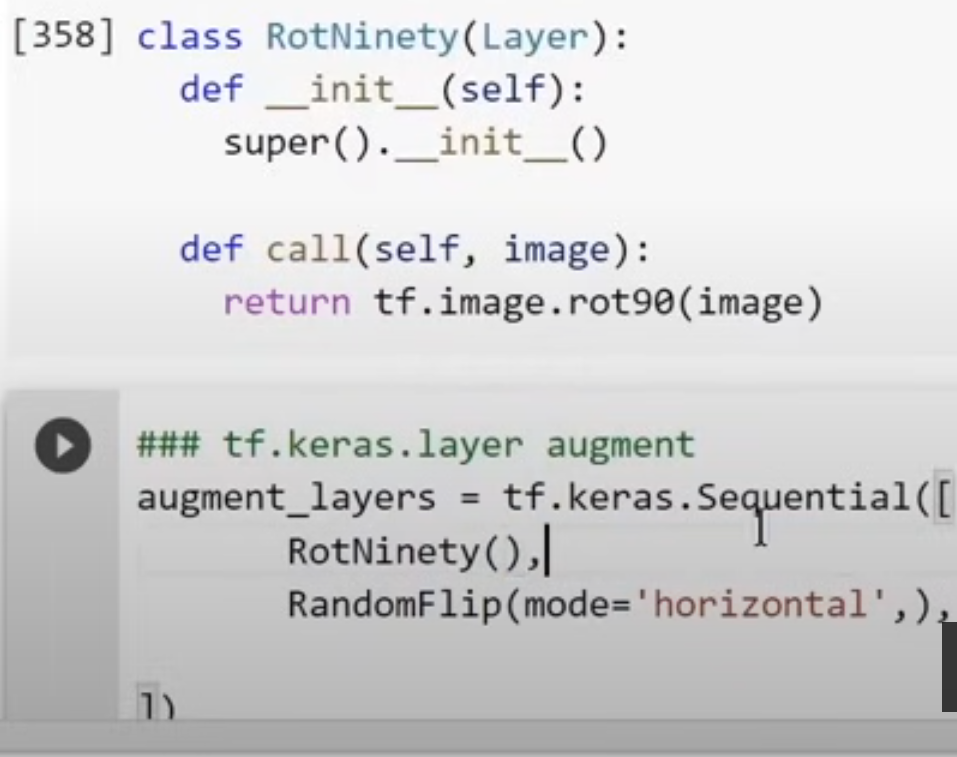

**Khi sử dụng data augmentation, thường ta sẽ áp dụng 1 loạt các layer (mỗi layer là random flip, constrain, ...) để tạo thành 1 hàm/chiến lược augmentation. Bằng cách này chỉ với 1 image, trong quá trình train, model có thể thấy được các hình ảnh khác nhau của ảnh này. Từ đó tăng tính tổng quát hóa của model, giúp model ít phụ thuộc vào các image trong train set. Đây cũng là 1 cách để tránh over fitting**

**Bản chất việc tạo image mới nhờ data augmentation không phải là tạo xong thêm vào dataset mà là 1 layer giúp biến đổi image thành 1 image khác trong quá trình train. Điều kiện tiên quyết là image sau khi thay đổi phải dữ được các đặc trưng vốn có của image.**

#### Mixup data augmntation

Ở phần trước ta đã học cách tạo 1 image mới từ 1 image cũ bằng cách áp dụng *tf.image*, *tf.keras.layers*. Phần này học cách tạo 1 image mới bằng cách gộp 2 hay nhiều image vào.

Tiền đề là image mới được tạo ra vẫn phải dữ được các đặc trưng vốn có của label => image mới được thường được tạo thành từ 2 image cùng 1 label

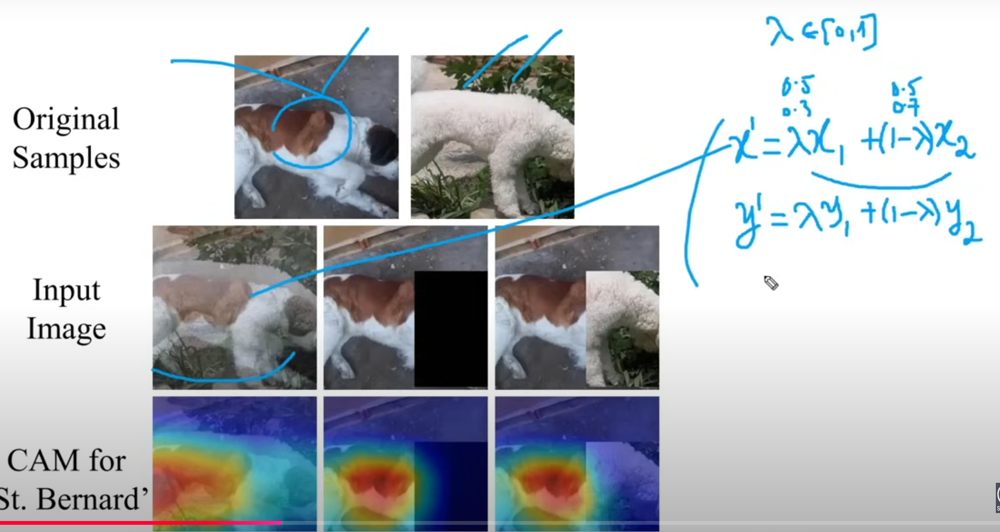

image là 1 ma trận, ta tạo ra image mới bằng cách tạo ma trận mới trong đó mỗi phần tử ma trận mới được mix bởi các giá trị của các image theo 1 tỷ lệ nào đó như trên hình.

Ngoài ra nếu image được tạo thành từ 2 image đến từ 2 label khác nhau thì label gía trị của label mới sẽ được tính theo tỷ lệ trên (nhìn hình)

Sử dụng [tf.distributions.Beta](https://www.tensorflow.org/probability/api_docs/python/tfp/distributions/Beta) để tạo image mới trong trường hợp này

In [ ]:
import tensorflow_probability as tfp

# tfp.distributions.Beta là 1 phần của thư viện mở rộng tensorflow_probability cung cấp các công cụ xác xuất và thống kê và nó dùng để tạo và làm việc với phân phối beta
# tfp.distributions.Beta(
#     concentration1, # alpha thường là 0.2 hoặc 0.4 theo kinh nhiệm, dùng nhiều nhất là 0.2
#     concentration0,
#     validate_args=False,
#     allow_nan_stats=True,
#     force_probs_to_zero_outside_support=False,
#     name=&#x27;Beta'
# )

IM_SIZE = 224

image_1 = cv2.resize(cv2.imread('cat.jpg'), (IM_SIZE, IM_SIZE))
image_2 = cv2.resize(cv2.imread('dog.jpg'), (IM_SIZE, IM_SIZE))

label_1 = 0
label_2 = 1

lamda = tfp.distributions.Beta(0.2, 0.2)
print(lamda.sample(1)[0])

image = lamda*image_1 + (1-lamda)*image_2
label = lamda*label_1 + (1-lamda)*label_2

print(image.shape, label)
plt.imshow(image/255)

In [ ]:
train_dataset_1 = (
    train
    .shuffle(buffer_size = 8, reshuffle_each_iteration = True)
    .map(augment) # data augmentation chỉ áp dụng với trainset
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

train_dataset_2 = (
    train
    .shuffle(buffer_size = 8, reshuffle_each_iteration = True)
    .map(augment) # data augmentation chỉ áp dụng với trainset
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

mixed_dataset = tf.data.Dataset.zip((train_dataset_1, train_dataset_2))

def mixup(train_dataset_1, train_dataset_2):
    (image_1, label_1), (image_2, label_2) = train_dataset_1, train_dataset_2

    lamda = tfp.distributions.Beta(0.4,0.4)
    lamda = lamda.sample(1)[0]

    image = lamda*image_1 + (1-lamda)*image_2
    label = lamda*tf.cast(label_1, dtype = tf.float32) + (1-lamda)*tf.cast(label_2, dtype = tf.float32)
    return image, label

BATCH_SIZE = 32
train_dataset = (
    mixed_dataset
    .shuffle(buffer_size = 8, reshuffle_each_iteration = True)
    .map(mixup)
    .batch(BATCH_SIZE)
    .prefetch(tf.data.AUTOTUNE)
)

#### Cut-Mix data augmentation

Vẫn là tạo image mới bằng cách sử dụng 2 image, nhưng lần này không phải là mix 2 image nữa mà là crop 1 phần image này và image khác rồi ghép vào nhau được image mới. 

Sử dụng [tf.image.crop_to_bounding_box](https://www.tensorflow.org/api_docs/python/tf/image/crop_to_bounding_box) để cắt ảnh hoặc bất cứ cách nào khác như opencv thậm chí numpy rồi ghe đè phần crop lên image còn lại

In [ ]:
plt.subplot(1,7,1)
image_1 = cv2.imread(cv2.imread('cat.jpg'), (IM_SIZE, IM_SIZE))
plt.imshow(image_1)

plt.subplot(1,7,2)
image_2 = cv2.imread(cv2.imread('cat.jpg'), (IM_SIZE, IM_SIZE))
plt.imshow(image_2)

plt.subplot(1,7,3)
crop = tf.image.crop_to_bounding_box(image_2, 20, 15, 100, 98)
plt.imshow(crop)

plt.subplot(1,7,4)
image_4 = tf.image.pad_to_bounding_box(crop, 20, 100, IM_SIZE, IM_SIZE)
plt.imshow(image_4)

plt.subplot(1,7,5)
plt.imshow(image_4 + image_1)

plt.subplot(1,7,6)
crop_cat = tf.image.crop_to_bounding_box(image_1, 20, 100, 100, 98)
plt.imshow(crop_cat)

plt.subplot(1,7,7)
image_5 = tf.image.pad_to_bounding_box(crop_cat, 20, 100, IM_SIZE, IM_SIZE)
plt.imshow(image_5)

Kinh nhiệm lấy bound box phù hợp

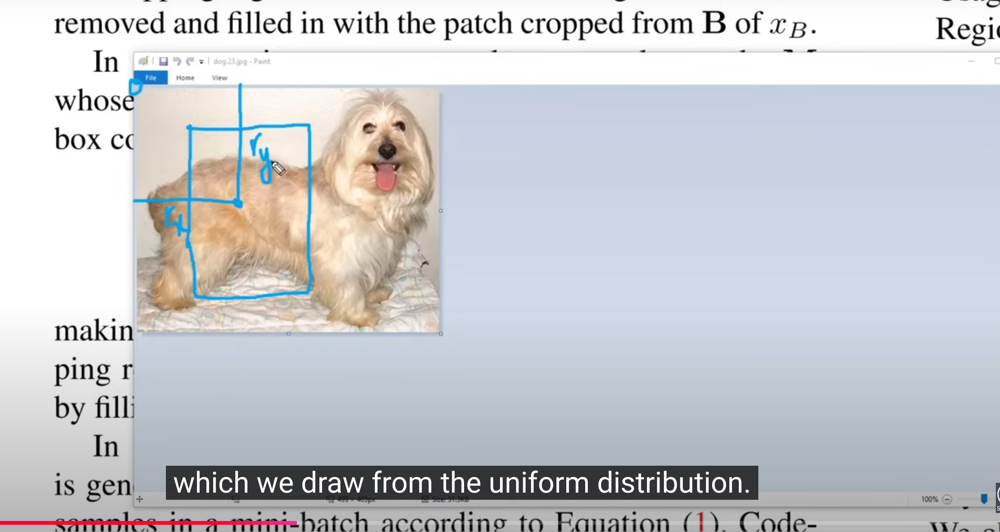

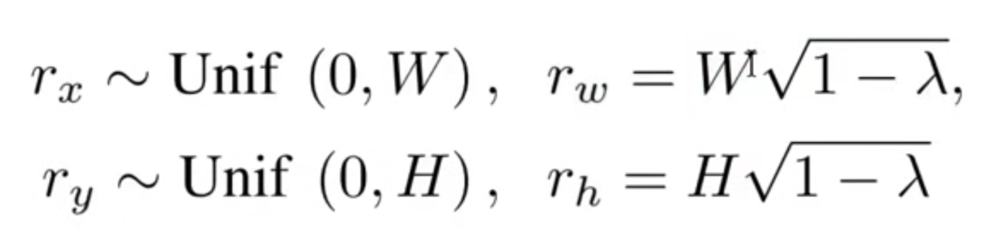

trong đó lamda được xác định tương tự như ở mixup data augmentation

In [ ]:
lamda = tfp.distributions.Beta(0.2, 0.2)
lamda = lamda.sample(1)[0]

r_x = tf.cast(tfp.distributions.Uniform(0, IM_SIZE).sample(1)[0], dtype = tf.int32)
r_y = tf.cast(tfp.distributions.Uniform(0, IM_SIZE).sample(1)[0], dtype = tf.int32)

r_w = tf.cast(IM_SIZE*tf.math.sqrt(1-lamda), dtype = tf.int32)
r_h = tf.cast(IM_SIZE*tf.math.sqrt(1-lamda), dtype = tf.int32)

r_x = r_x - r_w/2
r_y = r_y - r_h/2

print(r_x, r_y, r_w, r_h)

... rảnh xem lại

#### Data augmentation with Albumentations

[Albumentations](https://albumentations.ai/) là 1 thư viện python phổ biến đối với vấn đề image augmentation. Nó cung cấp rất nhiều api chuyên dụng và dễ code, được sử dụng trong industry, deep learning research, machine learning competitions, ...

Các tính năng của albumentations
- Cung cấp nhiều api để chỉnh sửa ảnh (quay ngang dock, crop, tăng giảm bão hòa, ...)
- Tích hợp tốt với các thư viện deep learning như tensorflow, pytorch, keras
- Hỗ trợ đa nhiệm: Albumentations cho phép áp dụng các biến đổi transform không chỉ cho ảnh mà còn cho cả mask (khi làm việc với segmentation), bounding box tự động (cho object detection), và keypoints (cho landmark detection).
- Pipeline linh hoạt: Người dùng có thể định nghĩa một chuỗi các phép biến đổi (transformation pipeline) để áp dụng cho dữ liệu. Mỗi phép biến đổi có thể được áp dụng với một **xác suất** nhất định.

Xây dựng chiến lược data augmentation bằng các [api](https://albumentations.ai/docs/getting_started/transforms_and_targets/) của albumentation. Có 2 loại api
- Pixel-level transform: chỉnh sửa ở mức pixel
- Spatial-level transform: chỉnh sửa ở mức không gian
Lưu ý khi dùng xác suất với mỗi layer:
- Nếu dataset đủ lớn thì không cần phải data augmentation nhiều nên xác xuất của mỗi phép biến đổi transform chỉ lên dừng ở 0.1-0.3
- Nếu dataset nhỏ thì xác suất mỗi phép biến đổi nên thuộc trong khoảng 0.4-0.5 không nên quá lớn

In [ ]:
import albumentation as A

tranforms = A.Compose([
    A.Resize(IM_SIZE, IM_SIZE),
    A.OneOf([A.HorizontalFlip(), A.VerticalFlip(), p=0.3]),
    A.RandomRotate90(),
    # A.RandomGridShuffle(grid=(3,3), always_apply=False, p=0.5),
    A.RandomGridShuffle(grid=(3, 3), always_apply=False, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, always_apply=False, p=0.5),
    # A.Sharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0). always_apply=False, p=0.5)
])

In [ ]:
def aug_albument(image):
    data = {"image":image}
    image = tranforms(**data)
    image = image["image"]
    image = tf.cast(image/255, tf.float32)
    return image

In [ ]:
def process_data(image, label):
    aug_img = tf.numpy_function(func=aug_albument, inp=[image], Tout=tf.float32)
    return aug_img, label

In [ ]:
train = (
    train
        .shuffle(buffer_size=1024, reshuffle_each_iteration = True)
        .map(process_data)
        .batch(BATCH_SIZE)
        .prefetch(tf.data.AUTOTUNE)
)

In [ ]:
im, _ = next(iter(train))
plt.imshow(im[0])

13:53:24